# 제주도 버스승차 인원 예측
- ## data 415423 rows × 71 columns
### Columns
- id : 해당 데이터에서의 고유한 id
- data : 날짜
- bus_route_id : 노선 ID
- in_out : 시내버스, 시외버스 구분
- station_code : 해당 승하차 정류소의 id
- station_name : 해당 승하차 정류소의 이름
- latitude : 해당 버스정류장의 위도
- longitude : 해당 버스정류장의 경도
- X-Y_ride : X:00:00 ~ x:59:59까지 승차한 인원 수
- X-Y_takeoff : X:00:00 ~ x:59:59까지 하차한 인원 수
- 18-20_ride : 18:00:00부터 19:59:59까지 승차한 인원 수
- 지번주소 : EDA 및 제주 날씨 merge용 column 
- si :EDA 및 제주 날씨 merge용 column 
- city : EDA 및 제주 날씨 merge용 column  
- dong : EDA 및 제주 날씨 merge용 column  
- road_addr : EDA 및 제주 날씨 merge용 column  
- weather_addr : EDA 및 제주 날씨 merge용 column 
- temperature : 온도
- precipitation : 강수량
- bus_interval : 노선 배차 간격
- date_day : 일 (1일 ~ 30일)
- date_dayofweek : 요일 (0 ~ 6)
- date_dayofname : 요일 (월 ~ 일)
- weekday : 평일 여부
- weekend : 주말 여부
- holiday : 공휴일 여부
- typhoon : 태풍이 온날
- in_ : 시내 버스 구분
- out : 시외 버스 구분
- ridexx : ride(탑승)의 2시간 간격 (ex 6시부터 ~7시 까지), 예측하는 y값이 18시 ~ 20시 까지이므로 생성함
- offxx : off(하차)의 2시간 간격 (ex 6시부터 ~7시 까지), 예측하는 y값이 18시 ~ 20시 까지이므로 생성함
- ride_sum : 승차인원의 합계
- off_sum : 하차인원의 합계
- bus_route_id_sum : 정류소, 일별 운행한 버스노선의 갯수
- bus_route_id_all_sum : 정류소별 9월 전체 운행한 버스노선의 갯수
- dis_jejusi : 해당 정류장의 제주시에서의 거리 ,맞은편 정류장 merge용 컬럼
- dis_seoquipo : 해당 정류장의 서귀포시에서의 거리,맞은편 정류장 merge용 컬럼
- ac_rideX : 맞은편 정류장의 탑승 인원(6시 ~ 11시)
- ac_offX : 맞은편 정류장의 하차 인원(6시 ~ 11시)
- ac_rideXX : 맞은편 정류장의 탑승의 2시간 간격 (ex 6시부터 ~7시 까지), 예측하는 y값이 18시 ~ 20시 까지이므로 생성함
- ac_offXX : 맞은편 정류장의 하차의 2시간 간격 (ex 6시부터 ~7시 까지), 예측하는 y값이 18시 ~ 20시 까지이므로 생성함
- ac_ride_sum : 맞은편 정류장의 승차인원 합계
- ac_off_sum의 : 맞은편 정류장의 하차인원 합계

### 0. 공통

In [1]:
# 추가되는 패키지는 여기에서 import 해주세요
import warnings
warnings.filterwarnings('ignore')
import missingno
import pandas as pd
import numpy as np
import datetime
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import pickle
from sklearn.externals import joblib
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from itertools import count
import plotly_express as px
from tqdm.notebook import tqdm
import geopy.distance

pd.options.mode.chained_assignment = None
pd.set_option('display.max_columns', 500)
# matplotlib 설정
mpl.use('Agg')
mpl.rcParams['axes.unicode_minus'] = False
%matplotlib inline
# seaborn 설정
sns.set()
sns.set_style("whitegrid")
sns.set_color_codes()
from matplotlib import font_manager, rc
font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
rc('font', family=font_name)

In [2]:
pd.set_option('max_columns', 700)
pd.set_option('max_rows', 500)

## 2. Data EDA

In [3]:
#데이터 불러오기
# 415423 rows × 71 columns
raw_data = pd.read_csv('raw_train.csv')
raw_data.tail(2)

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,dis_jejusi,dis_seoquipo,ac_ride6,ac_ride7,ac_ride8,ac_ride9,ac_ride10,ac_ride11,ac_off6,ac_off7,ac_off8,ac_off9,ac_off10,ac_off11,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ac_ride67,ac_ride89,ac_ride1011,ac_off67,ac_off89,ac_off1011,ride_sum,ac_ride_sum,off_sum,ac_off_sum,bus_route_id_sum,bus_route_id_all_sum
415421,415421,2019-09-30,32820000,시내,3291,애월환승정류장(애월리),33.46483,126.31870,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.380000,31.873252,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 애월읍 애월리 1534-2,제주시,애월읍,애월리,애월로,제주,23.6,22.6,8.0,30,0,Monday,1.0,0.0,0,0,1,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,5,120
415422,415422,2019-09-30,32820000,시내,6115100,서귀포시외버스터미널,33.24873,126.50799,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,27.987818,4.828453,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,제주특별자치도 서귀포시 법환동 843,서귀포시,서귀포시,법환동,일주동로,서귀포,24.3,6.3,8.0,30,0,Monday,1.0,0.0,0,0,1,0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,1.0,15,440


#### 01. 날짜 EDA

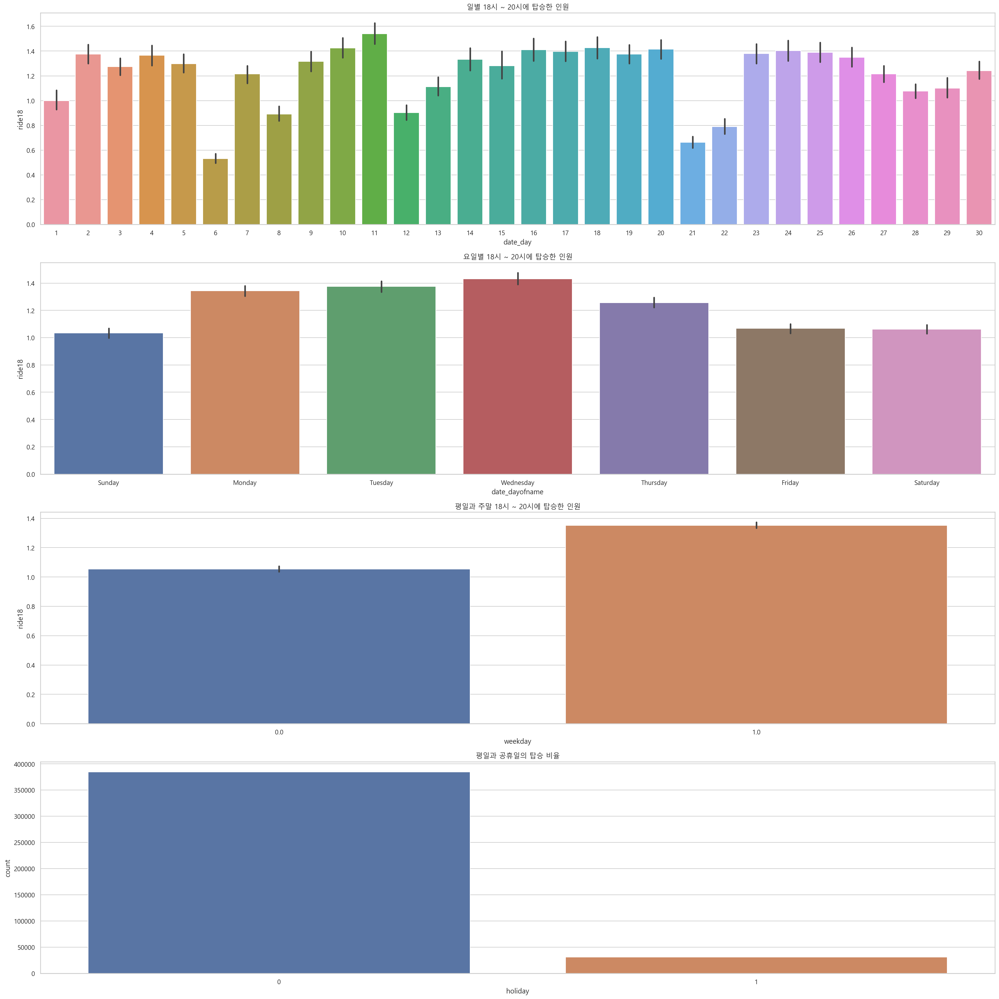

In [139]:
# 일별, 요일별 탑승한 인원 그래프
plt.figure(figsize=(24, 24))

plt.subplot(411)
plt.title('일별 18시 ~ 20시에 탑승한 인원')
sns.barplot(x='date_day', y='ride18', data=raw_data)

plt.subplot(412)
plt.title('요일별 18시 ~ 20시에 탑승한 인원')
sns.barplot(x='date_dayofname', y='ride18', data=raw_data)

plt.subplot(413)
plt.title('평일과 주말 18시 ~ 20시에 탑승한 인원')
sns.barplot(x='weekday', y='ride18', data=raw_data)

plt.subplot(414)
plt.title('평일과 공휴일의 탑승 비율')
sns.countplot(data=raw_data, x= 'holiday')

plt.tight_layout()
plt.show()

In [140]:
# 평일과 공휴일의 비율
raw_data['holiday'].value_counts() / raw_data['holiday'].value_counts().sum() * 100

0    92.605369
1     7.394631
Name: holiday, dtype: float64

In [142]:
raw_data

,id,date,bus_route_id,in_out,station_code,station_name,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,dis_jejusi,dis_seoquipo,ac_ride6,ac_ride7,ac_ride8,ac_ride9,ac_ride10,ac_ride11,ac_off6,ac_off7,ac_off8,ac_off9,ac_off10,ac_off11,지번주소,si,city,dong,road_addr,weather_addr,temperature,precipitation,bus_interval,date_day,date_dayofweek,date_dayofname,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ac_ride67,ac_ride89,ac_ride1011,ac_off67,ac_off89,ac_off1011,ride_sum,ac_ride_sum,off_sum,ac_off_sum,bus_route_id_sum,bus_route_id_all_sum
0,0,2019-09-01,4270000,시외,344,제주썬호텔,33.48990,126.49373,0.0,1.0,2.0,5.0,2.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.954920,26.256744,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,제주특별자치도 제주시 연동 291,제주시,제주시,연동,삼무로,제주,23.3,26.1,34.0,1,6,Sunday,0.0,1.0,0,0,0,1,1.0,7.0,8.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,3.0,16.0,2.0,0.0,3.0,1,30
1,1,2019-09-01,4270000,시외,357,한라병원,33.48944,126.48508,1.0,4.0,4.0,2.0,5.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,3.720275,26.403025,0.0,0.0,2.0,0.0,0.0,1.0,0.0,1.0,2.0,1.0,0.0,1.0,제주특별자치도 제주시 연동 2335-4,제주시,제주시,연동,도령로,제주,23.3,26.1,34.0,1,6,Sunday,0.0,1.0,0,0,0,1,5.0,6.0,11.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0,3.0,1.0,22.0,3.0,0.0,5.0,45,1515
2,2,2019-09-01,4270000,시외,432,정존마을,33.48181,126.47352,1.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,5.036124,25.893305,0.0,2.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 노형동 2617-2,제주시,제주시,노형동,노형로,제주,23.3,26.1,34.0,1,6,Sunday,0.0,1.0,0,0,0,1,2.0,2.0,0.0,0.0,0.0,0.0,2.0,1.0,2.0,0.0,0.0,0.0,4.0,5.0,0.0,0.0,21,749
3,3,2019-09-01,4270000,시내,1579,제주국제공항(600번),33.50577,126.49252,0.0,17.0,6.0,26.0,14.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,53.0,2.864166,27.997494,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 용담이동 833-2,제주시,제주시,용담이동,공항로,제주,23.3,26.1,34.0,1,6,Sunday,0.0,1.0,0,0,1,0,17.0,32.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,79.0,0.0,0.0,0.0,1,31
4,4,2019-09-01,4270000,시내,1646,중문관광단지입구,33.25579,126.41260,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,29.040353,13.574693,2.0,3.0,7.0,1.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 서귀포시 색달동 2551-3,서귀포시,서귀포시,색달동,천제연로,서귀포,22.6,18.7,34.0,1,6,Sunday,0.0,1.0,0,0,1,0,0.0,0.0,0.0,0.0,1.0,0.0,5.0,8.0,4.0,0.0,0.0,0.0,0.0,17.0,1.0,0.0,10,247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415418,415418,2019-09-30,32820000,시내,1129,한림환승정류장(한림리),33.41437,126.26336,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25.950139,32.385460,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 한림읍 한림리 1360-2,제주시,한림읍,한림리,한림로,고산,23.7,38.6,8.0,30,0,Monday,1.0,0.0,0,0,1,0,4.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,4.0,1.0,0.0,1.0,17,463
415419,415419,2019-09-30,32820000,시내,1564,제주시외버스터미널,33.49946,126.51479,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.754801,26.927069,6.0,30.0,2.0,12.0,0.0,1.0,0.0,0.0,0.0,3.0,0.0,0.0,제주특별자치도 제주시 오라일동 2441-4,제주시,제주시,오라일동,서광로,제주,23.6,22.6,8.0,30,0,Monday,1.0,0.0,0,0,1,0,4.0,0.0,0.0,0.0,0.0,0.0,36.0,14.0,1.0,0.0,3.0,0.0,4.0,51.0,0.0,3.0,23,719
415420,415420,2019-09-30,32820000,시내,2322,해병부대,33.23100,126.26273,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,38.482046,27.717482,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 서귀포시 대정읍 상모리 4165,서귀포시,대정읍,상모리,일주서로,고산,23.7,38.6,8.0,30,0,Monday,1.0,0.0,0,0,1,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,9,184
415421,415421,2019-09-30,32820000,시내,3291,애월환승정류장(애월리),33.46483,126.31870,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.380000,31.873252,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,제주특별자치도 제주시 애월읍 애월리 1534-2,제주시,애월읍,애월리,애월로,제주,23.6,22.6,8.0,30,0,Monday,1.0,0.0,0,0,1,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,5,120


#### 01.결론
- 6일, 21일, 22일은 탑승량이 유난히 작다 알아보자.
- 평일과 주말중엔 18시 ~ 20시 탑승인원이 평일이 많다. 아마 직장인인가보다.
- 공휴일에 탑승하는 인원은 아마도 관광객일 가능성이 있다.

#### 02. 시내외 EDA

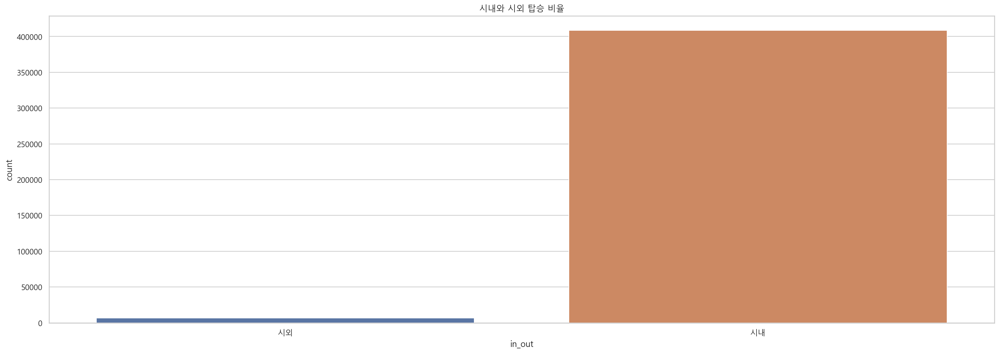

In [8]:
# 시내와 시외 탑승비율
# 제주도의 시는 제주시와 서귀포시를 의미.
# 시외버스는 거의 없다는것을 알수있고, 제주도의 시외버스터미널은 제주시와 서귀포시에 각 한개씩 있음.
# 이자료를 비추어보아, 위도경도를 거리화 할때 제주시와 서귀포시를 나누는것은 의미있을수도 있음.
plt.figure(figsize=(24, 8))
sns.countplot(data=raw_data, x= 'in_out')
plt.title('시내와 시외 탑승 비율')
plt.show()

In [9]:
# 시내와 시외버스 비율 약 98.3과 1.7
raw_data['in_out'].value_counts() / raw_data['in_out'].value_counts().sum() * 100

시내    98.333506
시외     1.666494
Name: in_out, dtype: float64

#### 02. 결론
- 시내와 시외는 대부분 시내 버스로 이루어져있는것으로 확인되었다. 
- 시외 버스를 구분지어 주면 좋지 않을까? 가설

#### 03. 버스노선 분석

In [10]:
station_table = pd.pivot_table(
    index=['station_code'], values='bus_route_id', data=raw_data, aggfunc=len).reset_index()
station_table.columns = ['station_code', 'bus_route_id_all_sum']
sort_table = station_table.sort_values(
    by='bus_route_id_all_sum', ascending=False)
sort_table["encoding"] = list(sort_table.reset_index(drop = True).reset_index(drop = False)["index"])
sort_table

,station_code,bus_route_id_all_sum,encoding
335,358,1610,0
3001,3270,1535,1
334,357,1515,2
3002,3271,1482,3
3009,3278,1423,4
...,...,...,...
760,818,1,3558
3091,3379,1,3559
3093,3382,1,3560
3094,3383,1,3561


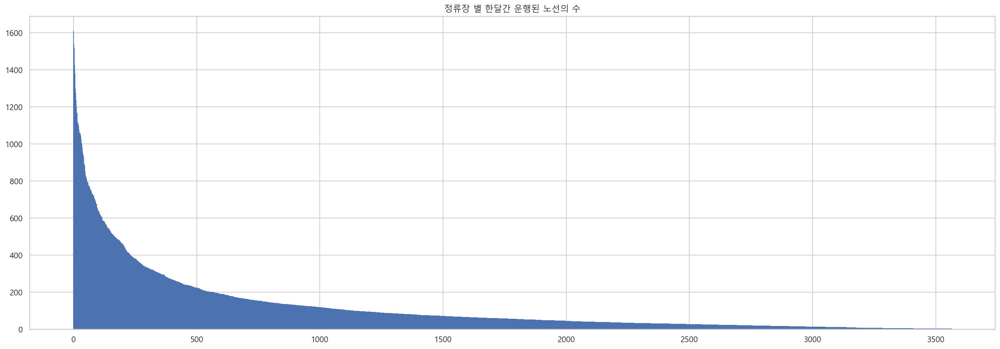

In [11]:
# 정류장 별 한달간 운행된 노선의 수
plt.figure(figsize=(24,8))
plt.bar(list(sort_table["encoding"]), list(sort_table["bus_route_id_all_sum"]),color = 'b',edgecolor = 'b')
plt.title('정류장 별 한달간 운행된 노선의 수')
plt.show()

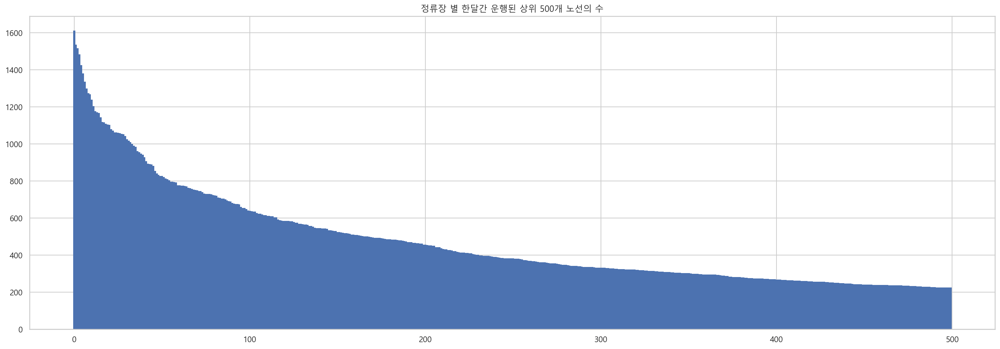

57.03


In [146]:
# 한달간 운행한 상위 500개의 정류장별 노선
plt.figure(figsize=(24,8))
plt.bar(list(sort_table["encoding"][:500]), list(sort_table["bus_route_id_all_sum"][:500]),color = 'b',edgecolor = 'b')
plt.title('한달간 운행한 상위 500개의 정류장별 노선')
plt.show()
print(round(sort_table["bus_route_id_all_sum"][:500].sum()/sort_table["bus_route_id_all_sum"].sum() * 100,2), '%')

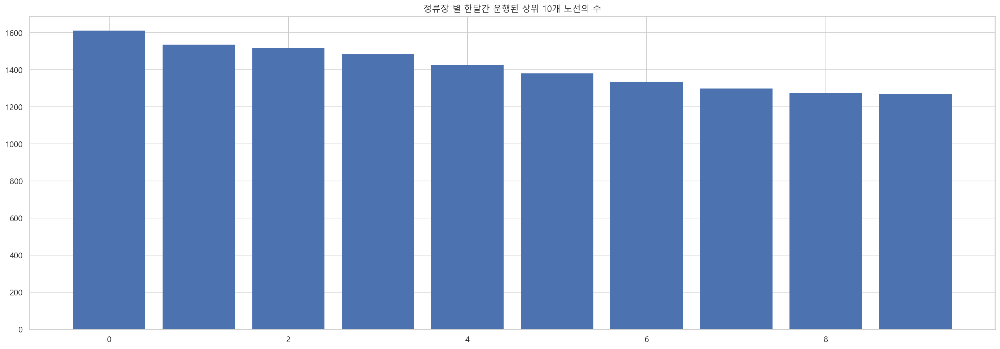

3.4 %


In [147]:
#정류장 별 한달간 운행된 상위 10개 노선의 수
plt.figure(figsize=(24,8))
plt.bar(list(sort_table["encoding"][:10]), list(sort_table["bus_route_id_all_sum"][:10]),color = 'b',edgecolor = 'b')
plt.title('한달간 운행한 상위 10개의 정류장별 노선')
plt.show()
print(round(sort_table["bus_route_id_all_sum"][:10].sum()/sort_table["bus_route_id_all_sum"].sum() * 100,2), '%')

#### 03. 결론
- 한달간 운행된 노선 중 상위 500개 정류장의 노선이 전체 데이터의 절반이상을 차지한다.
- 상위 500개 정류장은 전체 데이터의 대표성을 띄지 않을까?

#### 04. 승하차 인원 분석

In [14]:
# 승하차 인원 피봇테이블 생성
values = ['ride6', 'ride7', 'ride8', 'ride9', 'ride10', 'ride11', 
          'off6', 'off7', 'off8', 'off9', 'off10','off11', 
          'ride18']
values_ride = ['ride6', 'ride7', 'ride8', 'ride9', 'ride10', 'ride11']
values_off = ['off6', 'off7', 'off8', 'off9', 'off10', 'off11']

table_all = pd.pivot_table(raw_data, index=['station_name','station_code'], aggfunc=sum, values=values)
table_ride = pd.pivot_table(raw_data, index=['station_name','station_code'], aggfunc=sum, values=values_ride)
table_off = pd.pivot_table(raw_data, index=['station_name','station_code'], aggfunc=sum, values=values_off)
table_ride18 = pd.pivot_table(raw_data, index=['station_name','station_code'], aggfunc=sum, values='ride18')

In [15]:
# 전체 승하차 인원 분석
table_all['all'] = table_all['off10'] + table_all['off11'] + table_all['off6'] + table_all['off7'] + \
    table_all['off8']+table_all['off9'] + table_all['ride18'] + table_all['ride6'] + table_all['ride7'] + \
    table_all['ride8']+table_all['ride9'] + table_all['ride10'] + table_all['ride11']
table_all['percent'] = table_all['all'] / table_all['all'].sum() * 100
table_all

off10  off11  off6  off7   off8   off9  ride10  \
station_name station_code                                                   
(구)구판장       4211            0.0    0.0   0.0   0.0    1.0    0.0    11.0   
             4212            5.0    9.0   0.0   0.0    0.0    0.0     0.0   
(구)중문동주민센터   2058           21.0   25.0   4.0  22.0   35.0   26.0    89.0   
             2059          118.0   45.0   8.0  57.0  103.0  105.0    39.0   
(구)중앙파출소     1952           40.0   52.0  28.0  17.0   51.0   58.0   232.0   
...                          ...    ...   ...   ...    ...    ...     ...   
흥덕사          4199            0.0    1.0   0.0   0.0    1.0    2.0     0.0   
             4200            5.0    2.0   0.0   0.0    0.0    0.0     1.0   
희진주유소        2584           11.0   10.0   1.0   6.0   13.0   12.0    14.0   
             2585            3.0    3.0   0.0   0.0    9.0    2.0    15.0   
히귀반석         503             4.0    2.0   0.0   1.0   13.0    2.0    15.0   

                           ride11  ride18  ride6  ride7  ride8  ride9     all  \
station_name station_code                                                       
(구)구판장       4211             0.0     0.0    0.0   10.0   34.0    6.0    62.0   
             4212             0.0     0.0    0.0    0.0    0.0    0.0    14.0   
(구)중문동주민센터   2058            71.0   132.0   32.0  133.0  179.0  112.0   881.0   
             2059            50.0    83.0   61.0  112.0  136.0   95.0  1012.0   
(구)중앙파출소     1952           160.0   318.0  106.0  105.0   94.0  161.0  1422.0   
...                           ...     ...    ...    ...    ...    ...     ...   
흥덕사          4199             5.0     0.0    0.0    1.0    1.0    5.0    16.0   
             4200             1.0     0.0    0.0    0.0    1.0    0.0    10.0   
희진주유소        2584            13.0     3.0    9.0   28.0   10.0   20.0   150.0   
             2585             8.0    20.0    6.0   59.0   71.0   25.0   221.0   
히귀반석         503              3.0     2.0   21.0   26.0   40.0    4.0   133.0   

                            percent  
station_name station_code            
(구)구판장       4211          0.002064  
             4212          0.000466  
(구)중문동주민센터   2058          0.029330  
             2059          0.033691  
(구)중앙파출소     1952          0.047341  
...                             ...  
흥덕사          4199          0.000533  
             4200          0.000333  
희진주유소        2584          0.004994  
             2585          0.007358  
히귀반석         503           0.004428  

[3563 rows x 15 columns]

In [30]:
# 전체 승하차 인원이 가장 높은 10군데 정류장
# 하위는 ascending옵션을 지우시면 됨
table_all_top_10= table_all.sort_values(by='all',ascending = False)[:10].reset_index()
table_all_top_10

,station_name,station_code,off10,off11,off6,off7,off8,off9,ride10,ride11,ride18,ride6,ride7,ride8,ride9,all,percent
0,제주시청(광양방면),3271,2677.0,2834.0,580.0,1519.0,2839.0,2537.0,3569.0,4019.0,14206.0,1515.0,2526.0,3583.0,3284.0,45688.0,1.521041
1,제주시청(아라방면),3270,2866.0,3054.0,993.0,2186.0,3319.0,3115.0,2955.0,2818.0,10375.0,1842.0,3924.0,4461.0,3162.0,45070.0,1.500466
2,한라병원,357,2066.0,1714.0,939.0,2035.0,3058.0,2580.0,3257.0,2923.0,6330.0,1726.0,3043.0,3717.0,3380.0,36768.0,1.224077
3,한라병원,358,1813.0,1468.0,490.0,1991.0,3106.0,2483.0,2522.0,2541.0,7614.0,916.0,3052.0,3147.0,2547.0,33690.0,1.121604
4,제주시외버스터미널,1564,62.0,64.0,24.0,67.0,150.0,77.0,3828.0,3079.0,5555.0,2944.0,5337.0,4438.0,4164.0,29789.0,0.991733
5,제주대학교,201,400.0,284.0,114.0,418.0,702.0,309.0,1907.0,2651.0,17152.0,451.0,1084.0,1651.0,1356.0,28479.0,0.948120
6,제주국제공항(구제주방면),638,1541.0,1597.0,1375.0,2311.0,2463.0,1692.0,1379.0,1512.0,9435.0,246.0,1246.0,1638.0,1994.0,28429.0,0.946456
7,제주버스터미널,149,1684.0,1606.0,842.0,1370.0,1662.0,1609.0,2996.0,2420.0,5907.0,408.0,2008.0,2263.0,2987.0,27762.0,0.924250
8,제주국제공항(종점),2972,4822.0,4395.0,752.0,5333.0,5724.0,5314.0,79.0,87.0,372.0,7.0,82.0,69.0,112.0,27148.0,0.903809
9,제주국제공항(신제주방면),1355,1633.0,1780.0,1599.0,2681.0,2115.0,1736.0,970.0,1212.0,8216.0,131.0,736.0,1165.0,1204.0,25178.0,0.838224


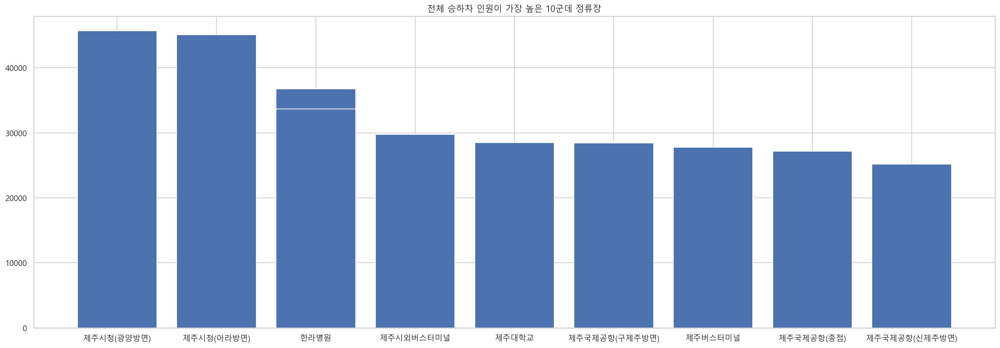

In [35]:
plt.figure(figsize=(24,8))
plt.bar(table_all_top_10['station_name'],table_all_top_10['all'])
plt.title('전체 승하차 인원이 가장 높은 10군데 정류장')
plt.show()

In [17]:
# 승차인원 분석
table_ride['ride_all'] = table_ride['ride6'] + table_ride['ride7'] + table_ride['ride8'] + \
    table_ride['ride9'] + table_ride['ride10'] + table_ride['ride11']
table_ride['percent'] = table_ride['ride_all'] / table_ride['ride_all'].sum() * 100
table_ride

ride10  ride11  ride6  ride7  ride8  ride9  \
station_name station_code                                               
(구)구판장       4211            11.0     0.0    0.0   10.0   34.0    6.0   
             4212             0.0     0.0    0.0    0.0    0.0    0.0   
(구)중문동주민센터   2058            89.0    71.0   32.0  133.0  179.0  112.0   
             2059            39.0    50.0   61.0  112.0  136.0   95.0   
(구)중앙파출소     1952           232.0   160.0  106.0  105.0   94.0  161.0   
...                           ...     ...    ...    ...    ...    ...   
흥덕사          4199             0.0     5.0    0.0    1.0    1.0    5.0   
             4200             1.0     1.0    0.0    0.0    1.0    0.0   
희진주유소        2584            14.0    13.0    9.0   28.0   10.0   20.0   
             2585            15.0     8.0    6.0   59.0   71.0   25.0   
히귀반석         503             15.0     3.0   21.0   26.0   40.0    4.0   

                           ride_all   percent  
station_name station_code                      
(구)구판장       4211              61.0  0.003892  
             4212               0.0  0.000000  
(구)중문동주민센터   2058             616.0  0.039307  
             2059             493.0  0.031458  
(구)중앙파출소     1952             858.0  0.054749  
...                             ...       ...  
흥덕사          4199              12.0  0.000766  
             4200               3.0  0.000191  
희진주유소        2584              94.0  0.005998  
             2585             184.0  0.011741  
히귀반석         503              109.0  0.006955  

[3563 rows x 8 columns]

In [38]:
# 승차 인원이 가장 높은 10군데 정류장
table_ride_top10= table_ride.sort_values(by='ride_all',ascending = False)[:10].reset_index()
table_ride_top10

,station_name,station_code,ride10,ride11,ride6,ride7,ride8,ride9,ride_all,percent
0,제주시외버스터미널,1564,3828.0,3079.0,2944.0,5337.0,4438.0,4164.0,23790.0,1.518039
1,제주시청(아라방면),3270,2955.0,2818.0,1842.0,3924.0,4461.0,3162.0,19162.0,1.222727
2,제주시청(광양방면),3271,3569.0,4019.0,1515.0,2526.0,3583.0,3284.0,18496.0,1.180229
3,한라병원,357,3257.0,2923.0,1726.0,3043.0,3717.0,3380.0,18046.0,1.151515
4,시외버스출발지(가상정류소),1565,2626.0,2519.0,1794.0,3063.0,2381.0,2954.0,15337.0,0.978654
5,한라병원,358,2522.0,2541.0,916.0,3052.0,3147.0,2547.0,14725.0,0.939602
6,제주버스터미널,149,2996.0,2420.0,408.0,2008.0,2263.0,2987.0,13082.0,0.834762
7,제주도청신제주로터리,320,2116.0,1893.0,1212.0,2542.0,2838.0,2286.0,12887.0,0.822319
8,아라주공아파트,124,1515.0,1524.0,1196.0,2592.0,2820.0,1882.0,11529.0,0.735665
9,화북남문,268,1584.0,1444.0,1189.0,2361.0,2887.0,1931.0,11396.0,0.727179


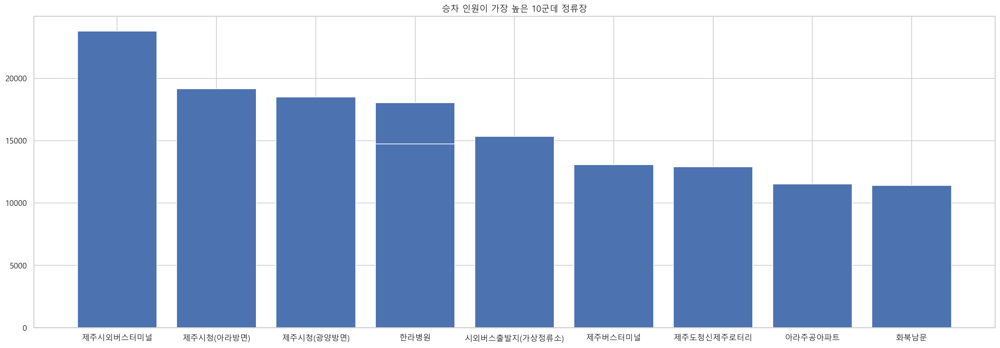

In [40]:
plt.figure(figsize=(24,8))
plt.bar(table_ride_top10['station_name'],table_ride_top10['ride_all'])
plt.title('승차 인원이 가장 높은 10군데 정류장')
plt.show()

In [41]:
# 하차인원 분석
table_off['off_all'] = table_off['off10'] + table_off['off11'] + \
    table_off['off6'] + table_off['off7'] + table_off['off8'] + table_off['off9']
table_off['percent'] = table_off['off_all'] / table_off['off_all'].sum() * 100
table_off

off10  off11  off6  off7   off8   off9  off_all  \
station_name station_code                                                    
(구)구판장       4211            0.0    0.0   0.0   0.0    1.0    0.0      1.0   
             4212            5.0    9.0   0.0   0.0    0.0    0.0     14.0   
(구)중문동주민센터   2058           21.0   25.0   4.0  22.0   35.0   26.0    133.0   
             2059          118.0   45.0   8.0  57.0  103.0  105.0    436.0   
(구)중앙파출소     1952           40.0   52.0  28.0  17.0   51.0   58.0    246.0   
...                          ...    ...   ...   ...    ...    ...      ...   
흥덕사          4199            0.0    1.0   0.0   0.0    1.0    2.0      4.0   
             4200            5.0    2.0   0.0   0.0    0.0    0.0      7.0   
희진주유소        2584           11.0   10.0   1.0   6.0   13.0   12.0     53.0   
             2585            3.0    3.0   0.0   0.0    9.0    2.0     17.0   
히귀반석         503             4.0    2.0   0.0   1.0   13.0    2.0     22.0   

                            percent  
station_name station_code            
(구)구판장       4211          0.000109  
             4212          0.001521  
(구)중문동주민센터   2058          0.014447  
             2059          0.047361  
(구)중앙파출소     1952          0.026722  
...                             ...  
흥덕사          4199          0.000435  
             4200          0.000760  
희진주유소        2584          0.005757  
             2585          0.001847  
히귀반석         503           0.002390  

[3563 rows x 8 columns]

In [43]:
# 하차 인원이 가장 높은 10군데 정류장
table_off_top10= table_off.sort_values(by='off_all',ascending = False)[:10].reset_index()
table_off_top10

,station_name,station_code,off10,off11,off6,off7,off8,off9,off_all,percent
0,제주국제공항(종점),2972,4822.0,4395.0,752.0,5333.0,5724.0,5314.0,26340.0,2.861224
1,제주시청(아라방면),3270,2866.0,3054.0,993.0,2186.0,3319.0,3115.0,15533.0,1.687297
2,제주버스터미널(종점),2969,2576.0,2748.0,127.0,2279.0,2902.0,2936.0,13568.0,1.473845
3,중앙로터리,1957,2278.0,1938.0,770.0,2900.0,3059.0,2524.0,13469.0,1.463091
4,제주시청(광양방면),3271,2677.0,2834.0,580.0,1519.0,2839.0,2537.0,12986.0,1.410625
5,한라병원,357,2066.0,1714.0,939.0,2035.0,3058.0,2580.0,12392.0,1.346101
6,제주국제공항(신제주방면),1355,1633.0,1780.0,1599.0,2681.0,2115.0,1736.0,11544.0,1.253985
7,제주버스터미널,150,1933.0,2448.0,1221.0,1635.0,2003.0,2303.0,11543.0,1.253877
8,한라병원,358,1813.0,1468.0,490.0,1991.0,3106.0,2483.0,11351.0,1.233020
9,제주국제공항(구제주방면),638,1541.0,1597.0,1375.0,2311.0,2463.0,1692.0,10979.0,1.192611


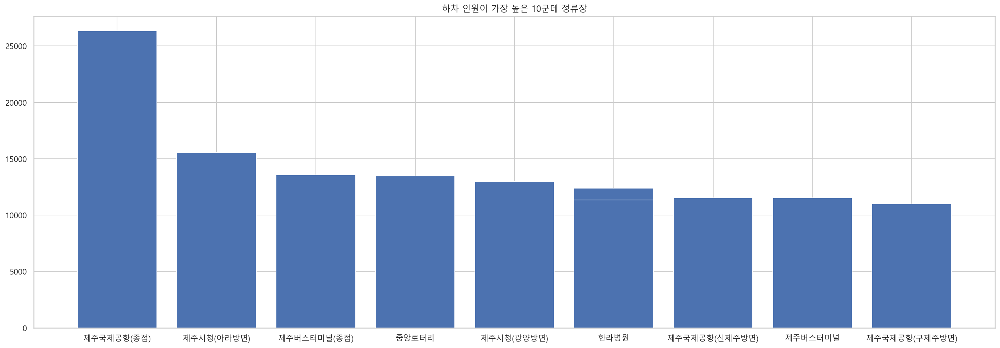

In [45]:
plt.figure(figsize=(24,8))
plt.bar(table_off_top10['station_name'],table_off_top10['off_all'])
plt.title('하차 인원이 가장 높은 10군데 정류장')
plt.show()

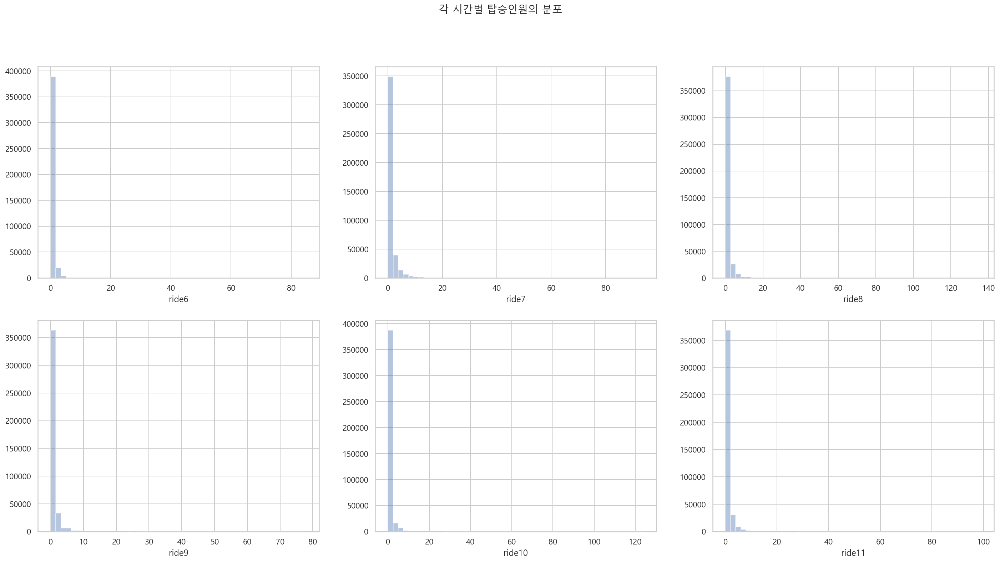

In [99]:
plt.figure(figsize=(24,12))
plt.suptitle('각 시간별 탑승인원의 분포')
plt.subplot(2,3,1)
sns.distplot(raw_data['ride6'],kde=False)
plt.subplot(2,3,2)
sns.distplot(raw_data['ride7'],kde=False)
plt.subplot(2,3,3)
sns.distplot(raw_data['ride8'],kde=False)
plt.subplot(2,3,4)
sns.distplot(raw_data['ride9'],kde=False)
plt.subplot(2,3,5)
sns.distplot(raw_data['ride10'],kde=False)
plt.subplot(2,3,6)
sns.distplot(raw_data['ride11'],kde=False)

plt.show()

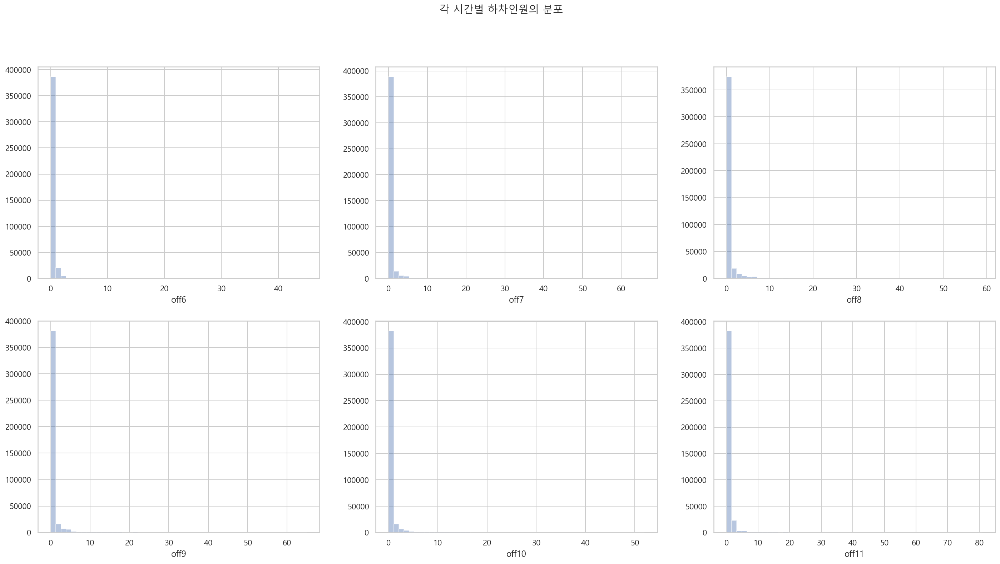

In [100]:
plt.figure(figsize=(24,12))
plt.suptitle('각 시간별 하차인원의 분포')
plt.subplot(2,3,1)
sns.distplot(raw_data['off6'],kde=False)
plt.subplot(2,3,2)
sns.distplot(raw_data['off7'],kde=False)
plt.subplot(2,3,3)
sns.distplot(raw_data['off8'],kde=False)
plt.subplot(2,3,4)
sns.distplot(raw_data['off9'],kde=False)
plt.subplot(2,3,5)
sns.distplot(raw_data['off10'],kde=False)
plt.subplot(2,3,6)
sns.distplot(raw_data['off11'],kde=False)
plt.show()

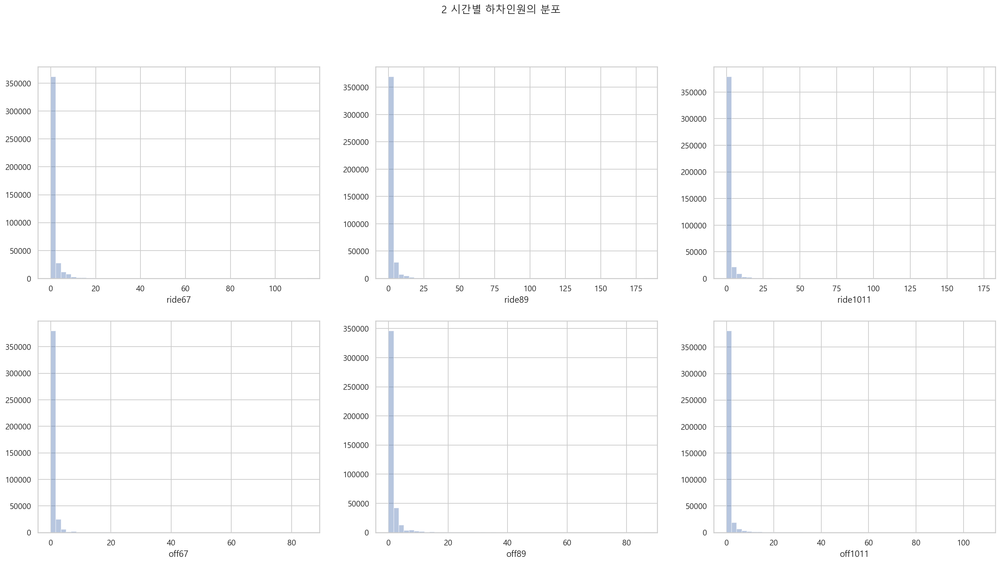

In [107]:
plt.figure(figsize=(24,12))
plt.suptitle('2 시간별 하차인원의 분포')
plt.subplot(2,3,1)
sns.distplot(raw_data['ride67'],kde=False)
plt.subplot(2,3,2)
sns.distplot(raw_data['ride89'],kde=False)
plt.subplot(2,3,3)
sns.distplot(raw_data['ride1011'],kde=False)
plt.subplot(2,3,4)
sns.distplot(raw_data['off67'],kde=False)
plt.subplot(2,3,5)
sns.distplot(raw_data['off89'],kde=False)
plt.subplot(2,3,6)
sns.distplot(raw_data['off1011'],kde=False)
plt.show()

제주시는 전체의  49.03 %


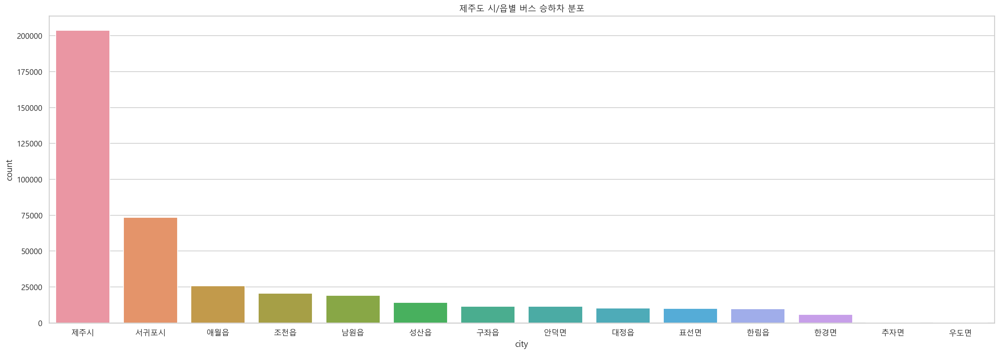

In [159]:
# 제주도 시/읍별 버스 승하차 분포
plt.figure(figsize=(24,8))
sns.countplot(raw_data['city'],order = raw_data['city'].value_counts().index)
plt.title('제주도 시/읍별 버스 승하차 분포')
print('제주시는 전체의 ',round(raw_data['city'].value_counts()[0] / raw_data['city'].value_counts().sum() * 100,2),'%')
plt.show()

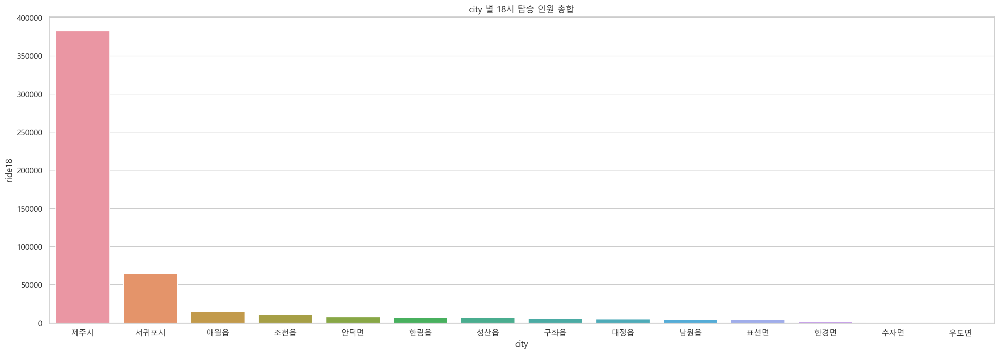

In [132]:
# city 별 18시 탑승 인원 총합
plt.figure(figsize=(24, 8))
table = raw_data.pivot_table(index='city', aggfunc='sum').reset_index().sort_values(by='ride18', ascending=False)
sns.barplot(data=table, x='city', y='ride18')
plt.title('city 별 18시 탑승 인원 총합')
plt.show()

#### 04. 결론
- 의외로 공항, 버스터미널, 병원 탑승인원이 많다. 아무래도 관광도시라 그런듯 하다.
- 제주시내에 큰병원이 있어서, 병원가는 사람들도 많은것 같다.
- 제주시(시내)쪽 탑승인원이 압도적으로 많으며, 전체의 50% 가량을 차지 한다.

#### 05. 배차간격

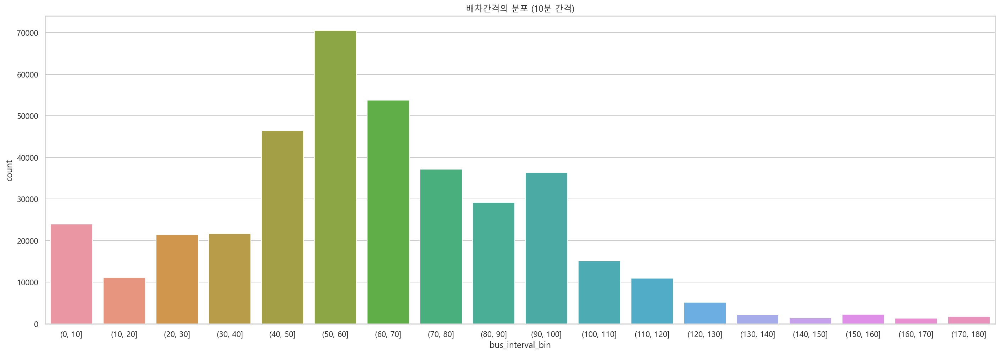

※ 참고 : 23563 개는 배차간격이 매우 큼


In [109]:
# 배차간격의 분포
interval_df = raw_data[raw_data['bus_interval'] < 999]
interval_df.pivot_table(index='bus_interval', aggfunc=len).reset_index()
bins = list(range(0, 190, 10))
interval_df['bus_interval_bin'] = pd.cut(interval_df['bus_interval'], bins)
interval_df['bus_interval_bin']
plt.figure(figsize=(24, 8))
sns.countplot(interval_df['bus_interval_bin'])
plt.title('배차간격의 분포 (10분 간격)')
plt.show()
print('※ 참고 :',len(raw_data[raw_data['bus_interval'] == 999]),'개는 배차간격이 매우 큼')

#### 05. 결론
- 50 ~ 60분 사이의 배차간격이 가장 많고, 의외로 10분 미만의 배차간격도 많이 보인다. 

#### 06. 날씨

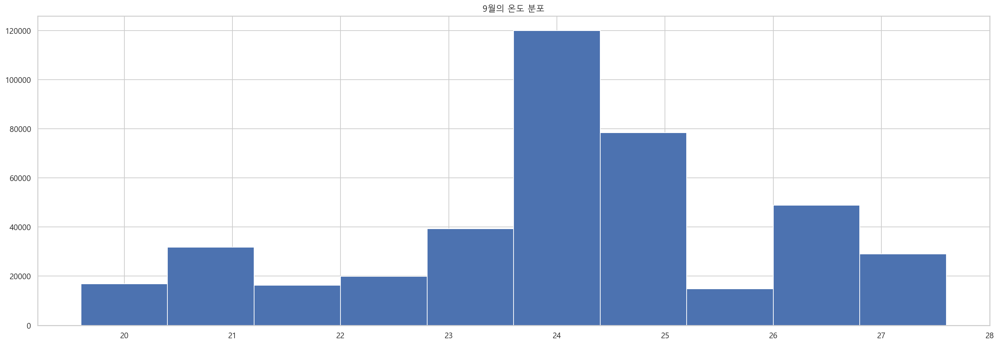

In [110]:
# 9월 온도 분포
plt.figure(figsize=(24,8))
plt.hist('temperature',data = raw_data)
plt.title('9월의 온도 분포')
plt.show()

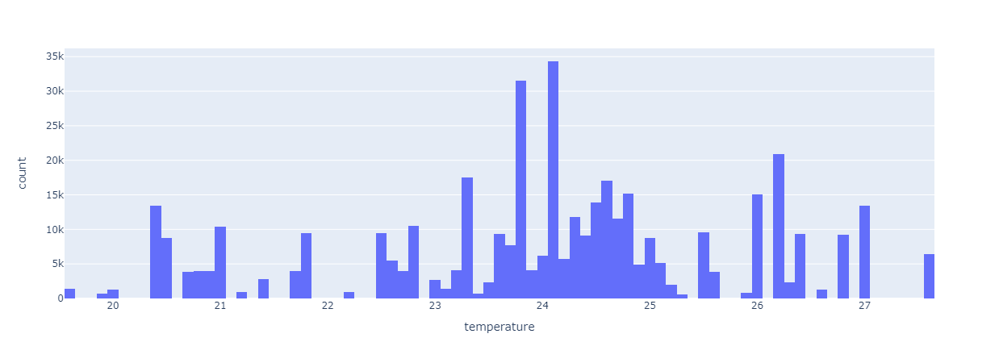

In [111]:
# 9월 온도 분포 (plotly)
fig = px.histogram(raw_data, x = 'temperature')
fig.show()

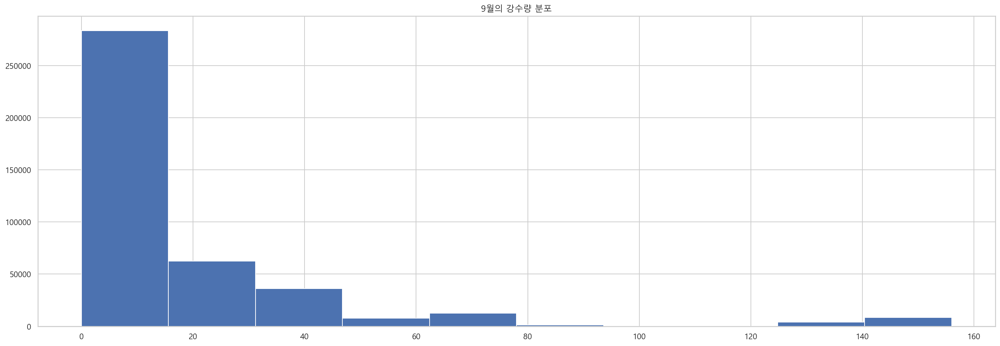

In [112]:
# 강수량 확인
# 강수량 높은건 그날 태풍이 왔음
plt.figure(figsize=(24,8))
plt.hist('precipitation',data = raw_data)
plt.title('9월의 강수량 분포')
plt.show()

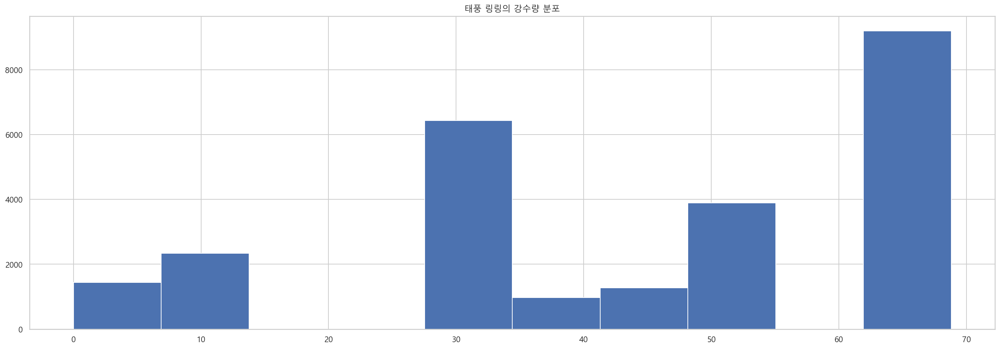

In [113]:
# 태풍 링링 온날의 강수량 확인
ringring = raw_data[(raw_data['date'] == '2019-09-06') | (raw_data['date'] == '2019-09-07')]
plt.figure(figsize=(24,8))
plt.hist('precipitation',data = ringring)
plt.title('태풍 링링의 강수량 분포')
plt.show()

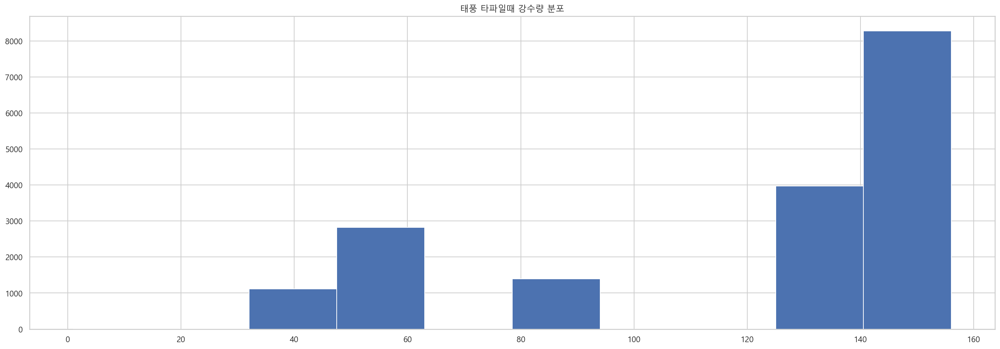

In [114]:
# 태풍 타파가 온날의 강수량 분포
tapa = raw_data[(raw_data['date'] == '2019-09-21') | (raw_data['date'] == '2019-09-22')]
plt.figure(figsize=(24,8))
plt.hist('precipitation',data = tapa)
plt.title('태풍 타파일때 강수량 분포')
plt.show()

태풍이 온날의 탑승인원의 평균은  0.7641931520504439 입니다.
태풍이 오지 않은날의 탑승인원의 평균  1.2974702245048162 입니다.
태풍이 온날의 탑승량의 최고치는  105.0 입니다.
태풍이 오지 않은날의 탑승량의 최고치는  272.0 입니다.


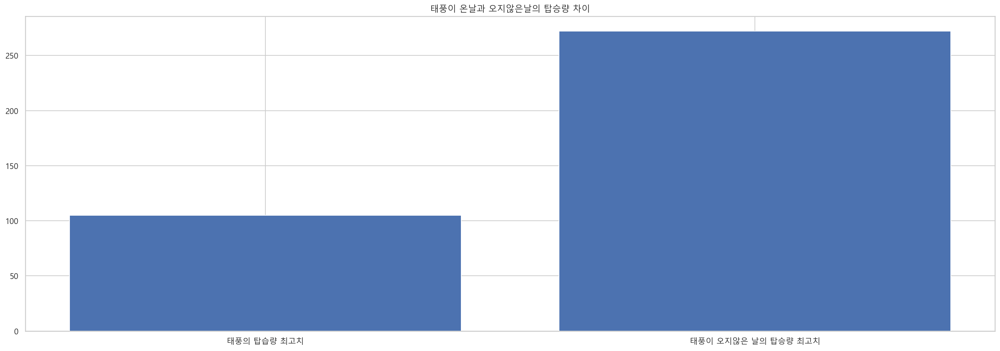

In [115]:
# 태풍이 온날과 오지않은날의 차이
typhoon = raw_data[(raw_data['date'] == '2019-09-06') | (raw_data['date'] == '2019-09-07')
               | (raw_data['date'] == '2019-09-21') | (raw_data['date'] == '2019-09-22')]
not_typhoon = raw_data[(raw_data['date'] != '2019-09-06') & (raw_data['date'] != '2019-09-07')
                   & (raw_data['date'] != '2019-09-21') & (raw_data['date'] != '2019-09-22')]
print('태풍이 온날의 탑승인원의 평균은 ',typhoon.ride18.mean(),'입니다.')
print('태풍이 오지 않은날의 탑승인원의 평균 ',not_typhoon.ride18.mean(),'입니다.')
print('태풍이 온날의 탑승량의 최고치는 ',typhoon.ride18.max(),'입니다.')
print('태풍이 오지 않은날의 탑승량의 최고치는 ',not_typhoon.ride18.max(),'입니다.')
plt.figure(figsize=(24,8))
ad = pd.DataFrame({'강수량':{'태풍의 탑습량 최고치': typhoon.ride18.max(), '태풍이 오지않은 날의 탑승량 최고치': not_typhoon.ride18.max()}}).reset_index()
plt.bar(x = 'index', height = '강수량', data=ad)
plt.title('태풍이 온날과 오지않은날의 탑승량 차이')
plt.show()

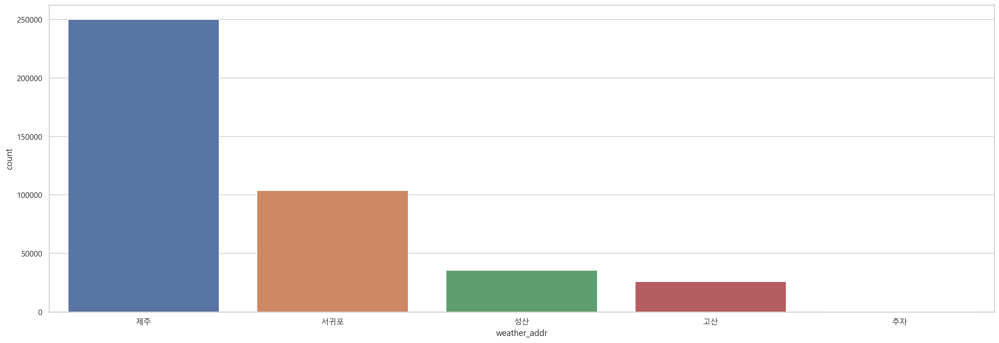

In [116]:
# 날씨를 구분짓는 지역별 countplot
plt.figure(figsize=(24,8))
sns.countplot(raw_data['weather_addr'], order = raw_data['weather_addr'].value_counts().index)
plt.show()

#### 06. 결론
- 9월의 온도는 특별히 눈에 띄게 덥거나 춥지 않으며, 태풍으로 인해 탑승객이 많이 줄은것을 알수있다.

#### 07. 위도경도로 정류장 위치 확인

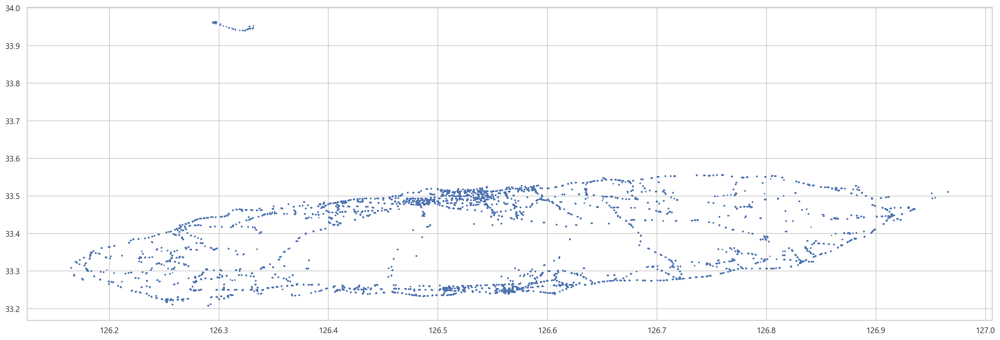

In [136]:
# 위도 경도 확인
plt.figure(figsize=(24, 8))
plt.scatter('longitude', 'latitude', data=raw_data,  s=0.8, edgecolor='b')
plt.show()

#### 07. 결론
- 위에서와 같이 제주도 시내와 서귀포시내에 정류장이 많이 몰려있는것을 알수 있다.

#### 08. 상관계수

In [117]:
# 상관계수 확인
train_corr = round(raw_data.corr(),2)
train_corr

,id,bus_route_id,station_code,latitude,longitude,ride6,ride7,ride8,ride9,ride10,ride11,off6,off7,off8,off9,off10,off11,ride18,dis_jejusi,dis_seoquipo,ac_ride6,ac_ride7,ac_ride8,ac_ride9,ac_ride10,ac_ride11,ac_off6,ac_off7,ac_off8,ac_off9,ac_off10,ac_off11,temperature,precipitation,bus_interval,date_day,date_dayofweek,weekday,weekend,holiday,typhoon,in_,out,ride67,ride89,ride1011,off67,off89,off1011,ac_ride67,ac_ride89,ac_ride1011,ac_off67,ac_off89,ac_off1011,ride_sum,ac_ride_sum,off_sum,ac_off_sum,bus_route_id_sum,bus_route_id_all_sum
id,1.00,0.04,-0.00,-0.01,-0.00,0.00,0.01,0.01,0.00,-0.00,-0.00,0.00,0.00,0.01,0.01,0.00,-0.00,-0.00,0.01,-0.01,0.00,0.01,0.01,0.00,-0.00,-0.00,0.00,0.01,0.01,0.01,0.00,-0.00,-0.53,-0.12,0.01,1.00,0.05,-0.08,0.08,-0.09,-0.12,0.00,-0.00,0.00,0.01,-0.00,0.00,0.01,0.00,0.01,0.01,-0.00,0.00,0.01,0.00,0.00,0.00,0.01,0.01,0.00,-0.01
bus_route_id,0.04,1.00,-0.02,-0.20,0.01,-0.07,-0.12,-0.13,-0.14,-0.13,-0.13,-0.02,-0.08,-0.10,-0.11,-0.12,-0.11,-0.14,0.19,-0.14,-0.07,-0.12,-0.12,-0.13,-0.12,-0.12,-0.02,-0.08,-0.10,-0.12,-0.11,-0.11,0.01,-0.03,0.16,0.00,-0.02,0.02,-0.02,-0.02,-0.01,0.10,-0.10,-0.12,-0.15,-0.15,-0.08,-0.13,-0.13,-0.12,-0.14,-0.14,-0.07,-0.13,-0.13,-0.17,-0.16,-0.14,-0.14,-0.04,-0.05
station_code,-0.00,-0.02,1.00,-0.05,-0.01,0.04,0.06,0.06,0.05,0.05,0.05,-0.00,0.02,0.02,0.02,0.02,0.03,0.03,0.10,-0.07,0.03,0.04,0.04,0.03,0.03,0.04,-0.01,0.01,0.01,0.01,0.02,0.02,0.00,-0.01,-0.02,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.09,0.09,0.06,0.06,0.06,0.02,0.03,0.03,0.04,0.04,0.04,0.01,0.02,0.02,0.07,0.05,0.03,0.02,-0.01,-0.00
latitude,-0.01,-0.20,-0.05,1.00,0.13,0.05,0.07,0.07,0.07,0.06,0.06,0.05,0.05,0.06,0.07,0.06,0.06,0.08,-0.78,0.77,0.04,0.08,0.07,0.07,0.06,0.06,0.05,0.05,0.06,0.07,0.06,0.06,-0.03,0.09,0.01,-0.01,0.01,-0.01,0.01,0.01,0.01,-0.01,0.01,0.07,0.08,0.07,0.06,0.07,0.07,0.08,0.08,0.07,0.06,0.08,0.07,0.09,0.09,0.08,0.09,0.29,0.31
longitude,-0.00,0.01,-0.01,0.13,1.00,-0.01,-0.02,-0.02,-0.01,-0.01,-0.01,-0.01,-0.02,-0.03,-0.01,-0.01,-0.01,-0.02,0.11,0.04,-0.01,-0.02,-0.02,-0.01,-0.00,-0.01,-0.01,-0.03,-0.03,-0.01,-0.01,-0.01,0.02,0.01,-0.05,0.00,-0.00,0.00,-0.00,-0.00,-0.01,0.07,-0.07,-0.02,-0.02,-0.01,-0.02,-0.03,-0.01,-0.02,-0.01,-0.01,-0.02,-0.03,-0.01,-0.02,-0.02,-0.02,-0.02,-0.02,-0.02
ride6,0.00,-0.07,0.04,0.05,-0.01,1.00,0.38,0.30,0.31,0.28,0.27,0.13,0.03,0.02,0.03,0.03,0.03,0.26,-0.07,0.02,0.07,0.11,0.11,0.11,0.10,0.09,0.02,0.05,0.08,0.06,0.06,0.07,-0.00,-0.01,0.00,0.00,-0.04,0.03,-0.03,-0.01,-0.02,-0.03,0.03,0.68,0.35,0.31,0.08,0.03,0.03,0.12,0.13,0.11,0.05,0.08,0.07,0.51,0.14,0.05,0.08,0.12,0.12
ride7,0.01,-0.12,0.06,0.07,-0.02,0.38,1.00,0.48,0.43,0.40,0.39,0.07,0.18,0.13,0.11,0.12,0.14,0.37,-0.10,0.02,0.12,0.16,0.17,0.17,0.16,0.14,0.04,0.09,0.12,0.12,0.12,0.12,-0.00,-0.03,-0.04,0.01,-0.10,0.09,-0.09,-0.06,-0.04,-0.01,0.01,0.93,0.52,0.45,0.18,0.14,0.14,0.17,0.20,0.17,0.09,0.14,0.14,0.73,0.22,0.18,0.15,0.13,0.12
ride8,0.01,-0.13,0.06,0.07,-0.02,0.30,0.48,1.00,0.51,0.46,0.45,0.09,0.12,0.30,0.19,0.18,0.21,0.45,-0.10,0.02,0.11,0.15,0.14,0.17,0.15,0.15,0.05,0.10,0.12,0.12,0.13,0.12,0.00,-0.02,-0.08,0.01,-0.06,0.06,-0.06,-0.04,-0.03,-0.02,0.02,0.49,0.89,0.52,0.14,0.30,0.22,0.16,0.18,0.17,0.10,0.14,0.14,0.77,0.20,0.28,0.16,0.15,0.15
ride9,0.00,-0.14,0.05,0.07,-0.01,0.31,0.43,0.51,1.00,0.54,0.52,0.13,0.14,0.19,0.34,0.25,0.24,0.49,-0.09,0.02,0.10,0.15,0.18,0.18,0.19,0.18,0.06,0.11,0.15,0.14,0.15,0.16,0.00,-0.01,-0.08,0.01,-0.03,0.03,-0.03,-0.02,-0.02,-0.03,0.03,0.46,0.84,0.60,0.17,0.31,0.28,0.16,0.20,0.21,0.12,0.17,0.18,0.77,0.23,0.32,0.19,0.15,0.15
ride10,-0.00,-0.13,0.05,0.06,-0.01,0.28,0.40,0.46,0.54,1.00,0.54,0.12,0.14,0.20,0.24,0.36,0.27,0.51,-0.08,0.02,0.10,0.14,0.16,0.19,0.18,0.19,0.06,0.11,0.15,0.16,0.16,0.16,0.01,-0.01,-0.08,0.00,-0.01,0.01,-0.01,-0.01,-0.02,-0.03,0.03,0.42,0.57,0.87,0.17,0.26,0.36,0.15,0.20,0.21,0.11,0.18,0.19,0.75,0.23,0.33,0.20,0.15,0.16


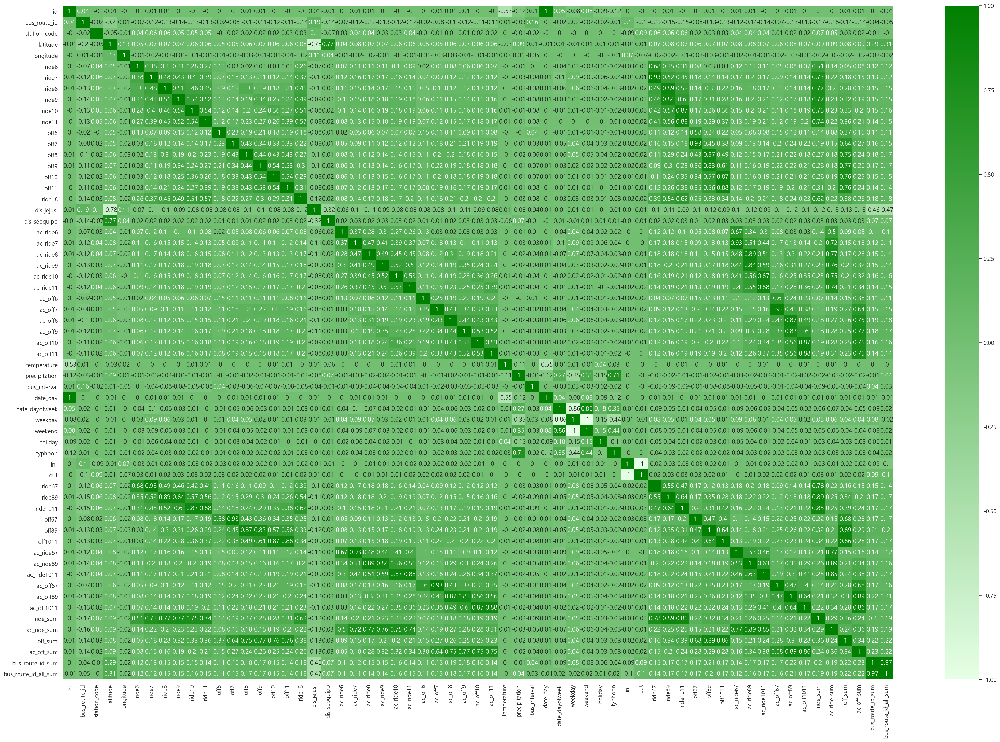

In [119]:
# 상관계수의 heatmap
plt.figure(figsize=(36, 24))
sns.heatmap(train_corr, annot=True, cmap=sns.light_palette("green", as_cmap=True))
plt.show()

#### 09. 결론 정리

- #### 01.결론
- 6일, 21일, 22일은 탑승량이 유난히 작다 알아보자.
- 평일과 주말중엔 18시 ~ 20시 탑승인원이 평일이 많다. 아마 직장인인가보다.
- 공휴일에 탑승하는 인원은 아마도 관광객일 가능성이 있다.
- #### 02. 결론
- 시내와 시외는 대부분 시내 버스로 이루어져있는것으로 확인되었다. 
- 시외 버스를 구분지어 주면 좋지 않을까? 가설
- #### 03. 결론
- 한달간 운행된 노선 중 상위 500개 정류장의 노선이 전체 데이터의 절반이상을 차지한다.
- 상위 500개 정류장은 전체 데이터의 대표성을 띄지 않을까?
- #### 04. 결론
- 의외로 공항, 버스터미널, 병원 탑승인원이 많다. 아무래도 관광도시라 그런듯 하다.
- 제주시내에 큰병원이 있어서, 병원가는 사람들도 많은것 같다.
- 제주시(시내)쪽 탑승인원이 압도적으로 많으며, 전체의 50% 가량을 차지 한다.
- #### 05. 결론
- 50 ~ 60분 사이의 배차간격이 가장 많고, 의외로 10분 미만의 배차간격도 많이 보인다.
- #### 06. 결론
- 9월의 온도는 특별히 눈에 띄게 덥거나 춥지 않으며, 태풍으로 인해 탑승객이 많이 줄은것을 알수있다.
- #### 07. 결론
- 위에서와 같이 제주도 시내와 서귀포시내에 정류장이 많이 몰려있는것을 알수 있다.